# Ensemble Techniques Project

**About the Project:**
The data consists of those diagnosed with Parkinson Disease and those who do not.

**Objective:**
Goal is to classify the patients into the respective labels using the attributes from their voice recordings

**Steps to be followed:**

1. Load the dataset
2. It is always a good practice to eye-ball raw data to get a feel of the data in terms of number of records, structure of the file, number of attributes,types of attributes and a general idea of likely challenges in the dataset. Mention a few comments in this regard (5 points)
3. Using univariate & bivariate analysis to check the individual attributes for their basic statistics such as central values, spread, tails, relationships between variables etc. mention your observations (15 points)
4. Split the dataset into training and test set in the ratio of 70:30 (Training:Test) (5 points)
5. Prepare the data for training - Scale the data if necessary, get rid of missing values (if any) etc (5 points)
6. Train at least 3 standard classification algorithms - Logistic Regression, Naive Bayes’, SVM, k-NN etc, and note down their accuracies on the test data (10 points)
7. Train a meta-classifier and note the accuracy on test data (10 points)
8. Train at least one standard Ensemble model - Random forest, Bagging, Boosting etc, and note the accuracy (10 points)
9. Compare all the models (minimum 5) and pick the best one among them (10 points)

# Import the Libraries

In [90]:
# !pip install imblearn
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix

# Load the dataset

In [91]:
#Loading the dataset
data = pd.read_csv("Data - Parkinsons")
data.head(5)

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [92]:
#Print last 5 rows of parkinson data set
data.tail()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
190,phon_R01_S50_2,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
191,phon_R01_S50_3,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
192,phon_R01_S50_4,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
193,phon_R01_S50_5,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306
194,phon_R01_S50_6,214.289,260.277,77.973,0.00567,0.00003,0.00295,0.00317,0.00885,0.01884,...,0.03078,0.04398,21.209,0,0.462803,0.664357,-5.724056,0.190667,2.555477,0.148569


# It is always a good practice to eye-ball raw data to get a feel of the data in terms of 
1. Number of structure of the file
2. Number of attributes
3. Types of attributes 
4. a general idea of likely challenges in the dataset. (2.5 points)

**Parkinson data structure**

In [93]:
print(f" Shape of the insurance data set: {data.shape}\n")
total_rows=data.shape[0]
total_cols=data.shape[1]
print(f" Total no of rows in the dataset: {total_rows}")
print(f" Total no of the column in the dataset: {total_cols}")

 Shape of the insurance data set: (195, 24)

 Total no of rows in the dataset: 195
 Total no of the column in the dataset: 24


**Observation**: Total 195 rows with 24 column in the data set, Very Small Dataset

**Checking the presence of missing values**

In [94]:
print(data.isnull().values.any())

False


In [95]:
print('Total number of missing values:',data.isnull().sum().sum())

Total number of missing values: 0


In [96]:
#missing data by percentage for each attributes
total = data.isnull().sum().sort_values(ascending=False)
percent = (data.isnull().sum()/data.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
PPE,0,0.0
D2,0,0.0
MDVP:Fo(Hz),0,0.0
MDVP:Fhi(Hz),0,0.0
MDVP:Flo(Hz),0,0.0
MDVP:Jitter(%),0,0.0
MDVP:Jitter(Abs),0,0.0
MDVP:RAP,0,0.0
MDVP:PPQ,0,0.0
Jitter:DDP,0,0.0


In [97]:
print("\nTotal Attributes in Parkinson Data Frame are: {}".format(len(data.columns)))
print("\nTotal Attributes in Parkinson Data Frame and data type: \n {}".format(data.dtypes))


Total Attributes in Parkinson Data Frame are: 24

Total Attributes in Parkinson Data Frame and data type: 
 name                 object
MDVP:Fo(Hz)         float64
MDVP:Fhi(Hz)        float64
MDVP:Flo(Hz)        float64
MDVP:Jitter(%)      float64
MDVP:Jitter(Abs)    float64
MDVP:RAP            float64
MDVP:PPQ            float64
Jitter:DDP          float64
MDVP:Shimmer        float64
MDVP:Shimmer(dB)    float64
Shimmer:APQ3        float64
Shimmer:APQ5        float64
MDVP:APQ            float64
Shimmer:DDA         float64
NHR                 float64
HNR                 float64
status                int64
RPDE                float64
DFA                 float64
spread1             float64
spread2             float64
D2                  float64
PPE                 float64
dtype: object


**Observation:**
1. The dataset do not have any null/missing values. Except 'name' all other columns have float/int Numerical values. 

2. 'status' column have binary(0 or 1) value

3. Status has two values 0 or 1 - 0 is for healthy and 1 is for having Pakinson diseses of the subject

4. Among this all the attributes status is target attribute for our analysis

5. Spread1 is having negetive value

6. Except name and leaving status(binary format) all other columns are continuous or kinda continuous variables

In [98]:
# Let us look at the target column which is 'status' to understand how the data is distributed amongst the various values
data.groupby(["status"]).count()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
status,,,,,,,,,,,,,,,,,,,,,
0,48,48,48,48,48,48,48,48,48,48,...,48,48,48,48,48,48,48,48,48,48
1,147,147,147,147,147,147,147,147,147,147,...,147,147,147,147,147,147,147,147,147,147


**Obsrvation:** 

1. Most are having parkinsons. The ratio is almost 3 times in favor or having parkinsons compared to healthy. **The model's ability to predict healthy will be in imbalance than predicting having parkinsons.** 

2. Total records with healthy status in Parkinson Data Frame: 48

3. Total records with parkinson status in Parkinson Data Frame: 147

# Using univariate & bivariate analysis to check the individual attributes for their basic statistic such as central values, spread, tails etc. What are your observations? (15 points)

**Basic statistic such as central values**

In [99]:
#Print basic statistics of parkinson data sets
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MDVP:Fo(Hz),195.0,154.228641,41.390065,88.333000,117.572000,148.790000,182.769000,260.105000
MDVP:Fhi(Hz),195.0,197.104918,91.491548,102.145000,134.862500,175.829000,224.205500,592.030000
MDVP:Flo(Hz),195.0,116.324631,43.521413,65.476000,84.291000,104.315000,140.018500,239.170000
MDVP:Jitter(%),195.0,0.006220,0.004848,0.001680,0.003460,0.004940,0.007365,0.033160
MDVP:Jitter(Abs),195.0,0.000044,0.000035,0.000007,0.000020,0.000030,0.000060,0.000260
MDVP:RAP,195.0,0.003306,0.002968,0.000680,0.001660,0.002500,0.003835,0.021440
MDVP:PPQ,195.0,0.003446,0.002759,0.000920,0.001860,0.002690,0.003955,0.019580
Jitter:DDP,195.0,0.009920,0.008903,0.002040,0.004985,0.007490,0.011505,0.064330
MDVP:Shimmer,195.0,0.029709,0.018857,0.009540,0.016505,0.022970,0.037885,0.119080
MDVP:Shimmer(dB),195.0,0.282251,0.194877,0.085000,0.148500,0.221000,0.350000,1.302000


In [100]:
#Removing name column from numerical analysis
data.drop(columns='name', inplace = True)   # It is of object type and is a id column we can drop the same for analysis

In [101]:
#Also Rearranging columns, to have the column "status" at the end considering it will be target variable.
arr_cols = [col for col in data if col != 'status'] + ['status']
data = data[arr_cols]
data.head(10).T

,0,1,2,3,4,5,6,7,8,9
MDVP:Fo(Hz),119.992000,122.400000,116.682000,116.676000,116.014000,120.552000,120.267000,107.332000,95.730000,95.056000
MDVP:Fhi(Hz),157.302000,148.650000,131.111000,137.871000,141.781000,131.162000,137.244000,113.840000,132.068000,120.103000
MDVP:Flo(Hz),74.997000,113.819000,111.555000,111.366000,110.655000,113.787000,114.820000,104.315000,91.754000,91.226000
MDVP:Jitter(%),0.007840,0.009680,0.010500,0.009970,0.012840,0.009680,0.003330,0.002900,0.005510,0.005320
MDVP:Jitter(Abs),0.000070,0.000080,0.000090,0.000090,0.000110,0.000080,0.000030,0.000030,0.000060,0.000060
MDVP:RAP,0.003700,0.004650,0.005440,0.005020,0.006550,0.004630,0.001550,0.001440,0.002930,0.002680
MDVP:PPQ,0.005540,0.006960,0.007810,0.006980,0.009080,0.007500,0.002020,0.001820,0.003320,0.003320
Jitter:DDP,0.011090,0.013940,0.016330,0.015050,0.019660,0.013880,0.004660,0.004310,0.008800,0.008030
MDVP:Shimmer,0.043740,0.061340,0.052330,0.054920,0.064250,0.047010,0.016080,0.015670,0.020930,0.028380
MDVP:Shimmer(dB),0.426000,0.626000,0.482000,0.517000,0.584000,0.456000,0.140000,0.134000,0.191000,0.255000


**Univariate & Bivariate analysis**

In [102]:
#Measuring the skewneww of the data to understand its distribution
data.skew(numeric_only  = True)

MDVP:Fo(Hz)         0.591737
MDVP:Fhi(Hz)        2.542146
MDVP:Flo(Hz)        1.217350
MDVP:Jitter(%)      3.084946
MDVP:Jitter(Abs)    2.649071
MDVP:RAP            3.360708
MDVP:PPQ            3.073892
Jitter:DDP          3.362058
MDVP:Shimmer        1.666480
MDVP:Shimmer(dB)    1.999389
Shimmer:APQ3        1.580576
Shimmer:APQ5        1.798697
MDVP:APQ            2.618047
Shimmer:DDA         1.580618
NHR                 4.220709
HNR                -0.514317
RPDE               -0.143402
DFA                -0.033214
spread1             0.432139
spread2             0.144430
D2                  0.430384
PPE                 0.797491
status             -1.187727
dtype: float64

**Let's visualize the distribution of the data**

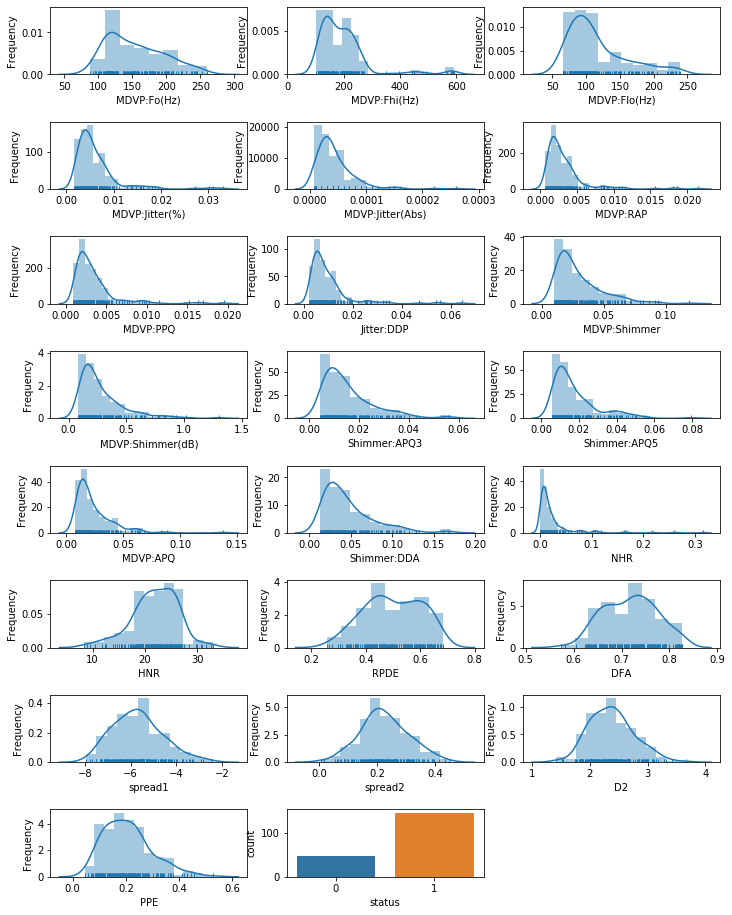

In [103]:
plt.figure(figsize= (12,16))  # Set the figure size
pos = 1    # a variable to manage the position of the subplot in the overall plot
for feature in data.columns:   # for-loop to iterate over every attribute whose distribution is to be visualized
    plt.subplot(8, 3, pos)   # plot grid
    plt.subplots_adjust(hspace=0.7, wspace=0.2)
#    sns.set(font_scale=1)  
    if feature!='status':   # Plot histogram for all the columns except name and status
        d=sns.distplot(data[feature], kde= True, rug=True)
#        d.axes.set_title(feature,fontsize=12)
#        d.set_xlabel(feature,fontsize=10)
        d.set_ylabel("Frequency",fontsize=10)
    else:
        sns.countplot(x='status', data=data);# Plot count graph for the column name
    pos += 1  # to plot over the grid one by one

**Observation:**
All of the below Attributes are right Skewed, having right tail

    MDVP:Fhi(Hz)        2.542146
    MDVP:Flo(Hz)        1.217350
    MDVP:Jitter(%)      3.084946
    MDVP:Jitter(Abs)    2.649071
    MDVP:RAP            3.360708
    MDVP:PPQ            3.073892
    Jitter:DDP          3.362058
    MDVP:Shimmer        1.666480
    MDVP:Shimmer(dB)    1.999389
    Shimmer:APQ3        1.580576
    Shimmer:APQ5        1.798697
    MDVP:APQ            2.618047
    Shimmer:DDA         1.580618
    NHR                 4.220709
    PPE                 0.797491
    
**Also all these  Attributes are having a lots of outliers causing the tails very long, We should correct the outliers and then redraw this graph as well as take into considertation for further calculation**

And the below Attributes are Normally distributed

    HNR                -0.514317
    RPDE               -0.143402
    DFA                -0.033214
    spread1             0.432139
    spread2             0.144430
    D2                  0.430384

**Checking the presence of outliers**

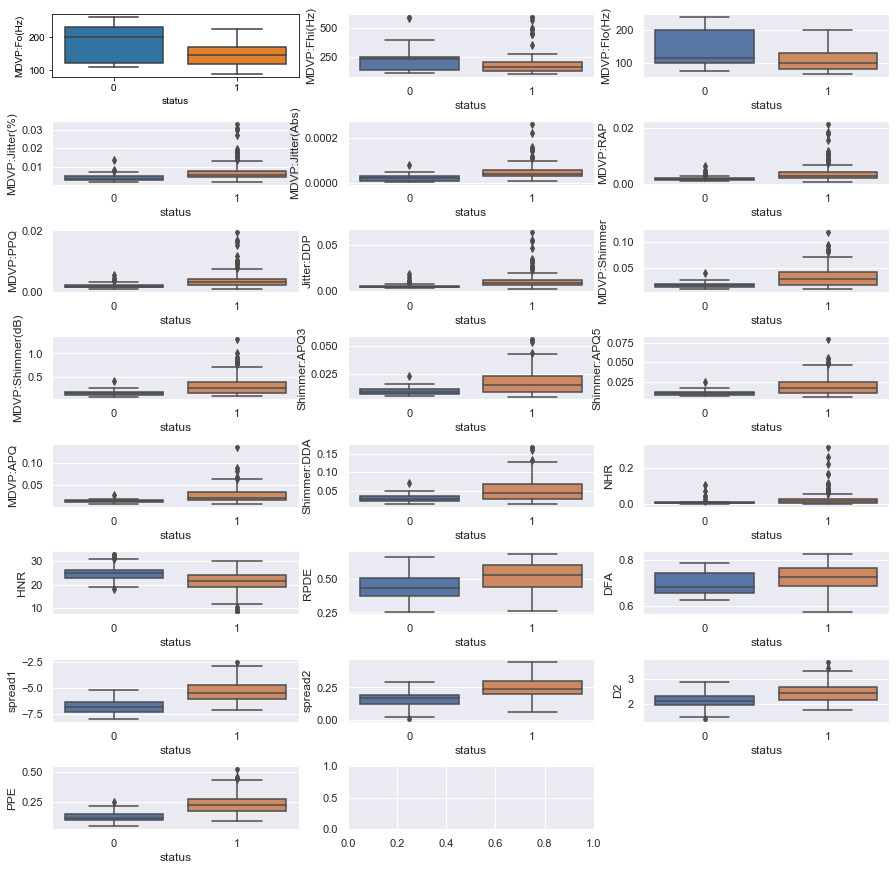

In [104]:
#Draw Box plot to visualze the outliers
plt.figure(figsize= (15,15))  # Set the figure size
pos = 1    # a variable to manage the position of the subplot in the overall plot
for feature in data.columns:   # for-loop to iterate over every attribute whose distribution is to be visualized
    plt.subplot(8, 3, pos)   # plot grid
    plt.subplots_adjust(hspace=0.7, wspace=0.2)
    if feature not in ['status']:   # Plot histogram for all the columns except name
        sns.boxplot(x='status', y=feature, data=data)
        sns.set(font_scale=1)       
    else:
        continue
    pos += 1  # to plot over the grid one by one 

**Observation** There are obvious outliers in the dataset, **Lets detect the outliers in the data**

In [105]:
#for detecting outlier defined a function with data as input and then calculate the outlier values
def find_outliers(data):
    outlier_data=[]
    for i in data:
        outlier_data=[]
        stat=data[i].describe()
        min=stat.loc['min']
        Q1=stat.loc['25%']
        median=stat.loc['50%']
        Q3=stat.loc['75%']
        max=stat.loc['max']
        IQR=Q3-Q1
        #print(min,Q1,median,Q3,max,IQR)
        for j in data[i]:
            #print('Second iteration j val:',j)
            #print('Second iteration j:',j)
            if(j < (Q1 - 1.5 * IQR)):
                #print('out lier values',i,j,Q1,Q3,IQR)
                outlier_data.append(j)
                
            if(j > (Q3 + 1.5 * IQR)):
                #print('out lier values',i,j,Q1,Q3,IQR)
                outlier_data.append(j)

        print('Outliers data for',i,':',len(outlier_data))
        print(outlier_data)
        print('\n')
    return

In [106]:
sub_df_ins=data.drop(["status"], axis = 1)
sub_df_ins
find_outliers(sub_df_ins)

Outliers data for MDVP:Fo(Hz) : 0
[]


Outliers data for MDVP:Fhi(Hz) : 11
[588.518, 586.567, 492.892, 442.557, 450.247, 442.824, 479.697, 565.74, 592.03, 581.289, 396.961]


Outliers data for MDVP:Flo(Hz) : 9
[225.227, 232.483, 232.435, 227.911, 231.848, 223.634, 229.256, 237.303, 239.17]


Outliers data for MDVP:Jitter(%) : 14
[0.01378, 0.01936, 0.03316, 0.01551, 0.03011, 0.01568, 0.01466, 0.01719, 0.01627, 0.01872, 0.03107, 0.027139999999999997, 0.01813, 0.0136]


Outliers data for MDVP:Jitter(Abs) : 6
[0.00015, 0.00026000000000000003, 0.00022, 0.00016, 0.00014, 0.00015]


Outliers data for MDVP:RAP : 14
[0.00743, 0.00826, 0.011590000000000001, 0.02144, 0.00905, 0.01854, 0.00863, 0.008490000000000001, 0.00996, 0.00919, 0.01075, 0.018, 0.01568, 0.011170000000000001]


Outliers data for MDVP:PPQ : 15
[0.007809999999999999, 0.00908, 0.0075, 0.0099, 0.01522, 0.00909, 0.016280000000000003, 0.00946, 0.008190000000000001, 0.01027, 0.00963, 0.01154, 0.01958, 0.01699, 0.00718]


Outliers dat

**Correcting Outliers Data for Future Analysis**

In [107]:
#for detecting outlier defined a function with data as input and then calculate the outlier values
def correct_outliers(data):
    out_data=data
    colx=0
    for i in data:
        stat=data[i].describe()
        min=stat.loc['min']
        Q1=stat.loc['25%']
        Q2=stat.loc['50%']       
        Q3=stat.loc['75%']
        max=stat.loc['max']
        IQR=Q3-Q1  
        count=0
        roh=0        
        for j in data[i]:
            max_val=(Q3 + 1.5 * IQR)
            min_val=(Q1 - 1.5 * IQR)
#            print(data.iloc[colx,roh])
            count+=1
            if(j > max_val):
                #print('outlier',i,roh,colx,j,Q2)
                #Replace the outliers value(higher Side) with the median
                out_data.iat[roh,colx]=Q2 
            elif(j < min_val):
                #print('outlier',i,roh,colx,j,Q2)
                #Replace the outliers value(lower Side) with the median                
                out_data.iat[roh,colx]=Q2 
            roh+=1
        colx+=1
    return out_data
#correct_outliers(sub_df_ins)

In [113]:
sub_df_ins=data.drop(["status"], axis = 1)
#print(sub_df_ins.columns)
outl_cor_data=correct_outliers(sub_df_ins)
#print(outl_cor_data)

**After Correction of Outliers Data with the median Value, Updated Graphs comming as below**

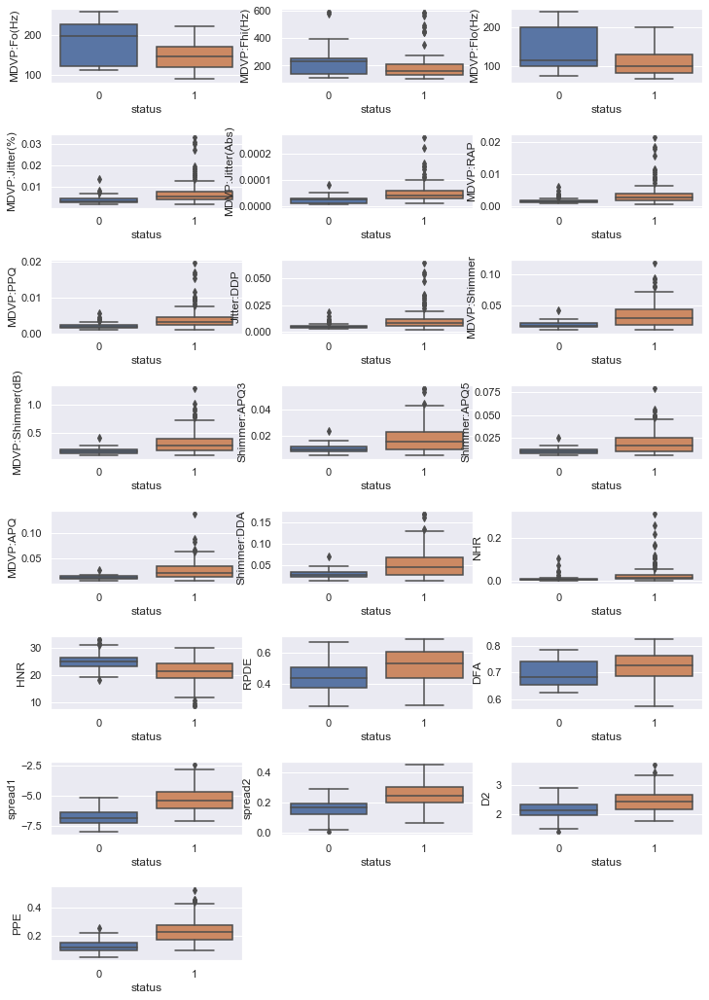

In [109]:
plt.figure(figsize= (12,18))  # Set the figure size
pos = 1    # a variable to manage the position of the subplot in the overall plot
for feature in outl_cor_data.columns:   # for-loop to iterate over every attribute whose distribution is to be visualized
    plt.subplot(8, 3, pos)   # plot grid
    plt.subplots_adjust(hspace=0.7, wspace=0.2)
#    sns.boxplot(data=outl_cor_data[feature])
    if feature not in ['status']:   # Plot histogram for all the columns except name
        sns.boxplot(x='status', y=feature, data=data)
#    sns.set(font_scale=1)       
    else:
        continue
    pos += 1  # to plot over the grid one by one 

**Observation: Most of the Outliers Corrected, few are still there due to data that was existed in the intitial stage, where median has distrubed**

# ZScore Scaling

**Before going for Pairplot to do the data analysis or for future KMean Analysis where the scaling is Very important, and looking into the data variety, lets scale the data using the zScore**

In [110]:
#pairplot diagram
sns.set_style(style='darkgrid')  # Setting the plot style. Purely for aesthetic purposes
%config InlineBackend.figure_format = 'svg'
from scipy.stats import zscore
outl_cor_data_scaled=outl_cor_data.apply(zscore)
sns.pairplot(outl_cor_data_scaled,diag_kind='kde')

In [114]:
#Generate the Co-relation Matrix
outl_cor_data_scaled.corr()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
MDVP:Fo(Hz),1.000000,0.845264,0.378390,-0.340948,-0.522098,-0.228029,-0.327825,-0.228137,-0.200703,-0.210272,...,-0.273863,-0.157262,-0.139726,0.084866,-0.383894,-0.446013,-0.467136,-0.248307,0.172261,-0.464869
MDVP:Fhi(Hz),0.845264,1.000000,0.204535,-0.202233,-0.389119,-0.114437,-0.158496,-0.114489,-0.112376,-0.104935,...,-0.146963,-0.107888,0.005763,-0.019101,-0.211006,-0.448268,-0.332040,-0.154239,0.203818,-0.324015
MDVP:Flo(Hz),0.378390,0.204535,1.000000,-0.383031,-0.301138,-0.360757,-0.364078,-0.360737,-0.256468,-0.290418,...,-0.317242,-0.164076,-0.402105,0.262819,-0.357107,0.166980,-0.313375,-0.122895,-0.075956,-0.291620
MDVP:Jitter(%),-0.340948,-0.202233,-0.383031,1.000000,0.777366,0.905851,0.852845,0.905757,0.541683,0.587561,...,0.531717,0.495367,0.551383,-0.522083,0.385066,0.281765,0.626769,0.319033,0.201204,0.678669
MDVP:Jitter(Abs),-0.522098,-0.389119,-0.301138,0.777366,1.000000,0.704246,0.749035,0.704018,0.517367,0.537808,...,0.484781,0.564770,0.367883,-0.540976,0.403678,0.381649,0.687276,0.389489,0.189696,0.736843
MDVP:RAP,-0.228029,-0.114437,-0.360757,0.905851,0.704246,1.000000,0.821425,0.999998,0.512537,0.560711,...,0.479849,0.475986,0.584303,-0.520525,0.311949,0.222749,0.505794,0.178666,0.198042,0.550239
MDVP:PPQ,-0.327825,-0.158496,-0.364078,0.852845,0.749035,0.821425,1.000000,0.821253,0.522869,0.573626,...,0.527905,0.475036,0.493527,-0.569345,0.409419,0.280856,0.589108,0.280930,0.184252,0.648735
Jitter:DDP,-0.228137,-0.114489,-0.360737,0.905757,0.704018,0.999998,0.821253,1.000000,0.512335,0.560547,...,0.479777,0.475641,0.584284,-0.520196,0.311687,0.222730,0.505522,0.178442,0.197741,0.550087
MDVP:Shimmer,-0.200703,-0.112376,-0.256468,0.541683,0.517367,0.512537,0.522869,0.512335,1.000000,0.951468,...,0.889720,0.897452,0.563179,-0.732634,0.450432,0.166454,0.558434,0.377896,0.366753,0.598086
MDVP:Shimmer(dB),-0.210272,-0.104935,-0.290418,0.587561,0.537808,0.560711,0.573626,0.560547,0.951468,1.000000,...,0.911721,0.861569,0.585863,-0.690882,0.424819,0.176022,0.531539,0.373327,0.349848,0.570567


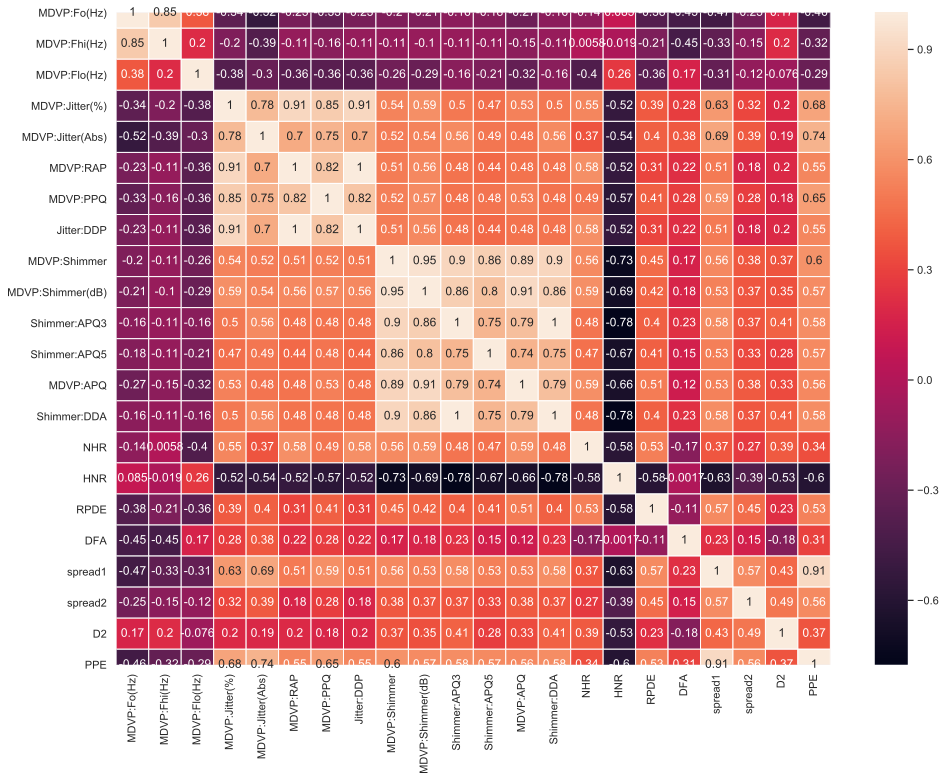

In [115]:
#Generate the Heat Map
plt.subplots(figsize=(16,12))
sns.heatmap(outl_cor_data_scaled.corr(), annot=True, linewidths=1)

**Observation: As the Number of Attributes is very high, lets calculate the Correlation among the attributes to come to a conclusion**

**High positive correlation among the attributes**

In [116]:
CorrMat = outl_cor_data_scaled.corr()
indices = np.where(CorrMat > 0.7)
indices = [(CorrMat.index[x], CorrMat.columns[y]) for x, y in zip(*indices) if x != y and x < y]
indices

[('MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)'),
 ('MDVP:Jitter(%)', 'MDVP:Jitter(Abs)'),
 ('MDVP:Jitter(%)', 'MDVP:RAP'),
 ('MDVP:Jitter(%)', 'MDVP:PPQ'),
 ('MDVP:Jitter(%)', 'Jitter:DDP'),
 ('MDVP:Jitter(Abs)', 'MDVP:RAP'),
 ('MDVP:Jitter(Abs)', 'MDVP:PPQ'),
 ('MDVP:Jitter(Abs)', 'Jitter:DDP'),
 ('MDVP:Jitter(Abs)', 'PPE'),
 ('MDVP:RAP', 'MDVP:PPQ'),
 ('MDVP:RAP', 'Jitter:DDP'),
 ('MDVP:PPQ', 'Jitter:DDP'),
 ('MDVP:Shimmer', 'MDVP:Shimmer(dB)'),
 ('MDVP:Shimmer', 'Shimmer:APQ3'),
 ('MDVP:Shimmer', 'Shimmer:APQ5'),
 ('MDVP:Shimmer', 'MDVP:APQ'),
 ('MDVP:Shimmer', 'Shimmer:DDA'),
 ('MDVP:Shimmer(dB)', 'Shimmer:APQ3'),
 ('MDVP:Shimmer(dB)', 'Shimmer:APQ5'),
 ('MDVP:Shimmer(dB)', 'MDVP:APQ'),
 ('MDVP:Shimmer(dB)', 'Shimmer:DDA'),
 ('Shimmer:APQ3', 'Shimmer:APQ5'),
 ('Shimmer:APQ3', 'MDVP:APQ'),
 ('Shimmer:APQ3', 'Shimmer:DDA'),
 ('Shimmer:APQ5', 'MDVP:APQ'),
 ('Shimmer:APQ5', 'Shimmer:DDA'),
 ('MDVP:APQ', 'Shimmer:DDA'),
 ('spread1', 'PPE')]

**High negative correlation among the attributes**

In [117]:
indices = np.where(CorrMat <= -0.7)
indices = [(CorrMat.index[x], CorrMat.columns[y]) for x, y in zip(*indices) if x != y and x < y]
indices

[('MDVP:Shimmer', 'HNR'), ('Shimmer:APQ3', 'HNR'), ('Shimmer:DDA', 'HNR')]

**Insignificant correlation among attributes**

In [118]:
indices = np.where((CorrMat < 0.5) & (CorrMat > -0.5))
indices = [(CorrMat.index[x], CorrMat.columns[y]) for x, y in zip(*indices) if x != y and x < y]
indices

[('MDVP:Fo(Hz)', 'MDVP:Flo(Hz)'),
 ('MDVP:Fo(Hz)', 'MDVP:Jitter(%)'),
 ('MDVP:Fo(Hz)', 'MDVP:RAP'),
 ('MDVP:Fo(Hz)', 'MDVP:PPQ'),
 ('MDVP:Fo(Hz)', 'Jitter:DDP'),
 ('MDVP:Fo(Hz)', 'MDVP:Shimmer'),
 ('MDVP:Fo(Hz)', 'MDVP:Shimmer(dB)'),
 ('MDVP:Fo(Hz)', 'Shimmer:APQ3'),
 ('MDVP:Fo(Hz)', 'Shimmer:APQ5'),
 ('MDVP:Fo(Hz)', 'MDVP:APQ'),
 ('MDVP:Fo(Hz)', 'Shimmer:DDA'),
 ('MDVP:Fo(Hz)', 'NHR'),
 ('MDVP:Fo(Hz)', 'HNR'),
 ('MDVP:Fo(Hz)', 'RPDE'),
 ('MDVP:Fo(Hz)', 'DFA'),
 ('MDVP:Fo(Hz)', 'spread1'),
 ('MDVP:Fo(Hz)', 'spread2'),
 ('MDVP:Fo(Hz)', 'D2'),
 ('MDVP:Fo(Hz)', 'PPE'),
 ('MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)'),
 ('MDVP:Fhi(Hz)', 'MDVP:Jitter(%)'),
 ('MDVP:Fhi(Hz)', 'MDVP:Jitter(Abs)'),
 ('MDVP:Fhi(Hz)', 'MDVP:RAP'),
 ('MDVP:Fhi(Hz)', 'MDVP:PPQ'),
 ('MDVP:Fhi(Hz)', 'Jitter:DDP'),
 ('MDVP:Fhi(Hz)', 'MDVP:Shimmer'),
 ('MDVP:Fhi(Hz)', 'MDVP:Shimmer(dB)'),
 ('MDVP:Fhi(Hz)', 'Shimmer:APQ3'),
 ('MDVP:Fhi(Hz)', 'Shimmer:APQ5'),
 ('MDVP:Fhi(Hz)', 'MDVP:APQ'),
 ('MDVP:Fhi(Hz)', 'Shimmer:DDA'),
 ('MDVP:Fhi(

# Split the dataset into training and test set in the ratio of 70:30 along with Scaling of the Data(Training:Test).

In [119]:
data.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654,1
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674,1
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634,1
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975,1
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335,1


In [120]:
#Split the dataset into training and test set in the ratio of 70:30 (Training:Test).
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

#Select Ststus as a dependent variable
y = data['status']

# lets drop status as a dependent variable and "name" attribute which is of object type for model building.
X = data.drop(['status'], axis=1)

#Split the data in the ratio of 70:30
X_train,X_test,y_train,y_test = train_test_split(X, y ,test_size=0.30, random_state=1)


# Prepare the data for training - Scale the data

**SMOTE to upsample smaller class**

In [121]:
# calculate accuracy measures and confusion matrix
from sklearn.metrics import recall_score
from imblearn.over_sampling import SMOTE

print("Before UpSampling, counts of label '1': {}".format(sum(y_train==1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train==0)))

sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   #Synthetic Minority Over Sampling Technique
X_train_res, y_train_res = sm.fit_sample(X_train, y_train.ravel())


print("After UpSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_train_res==0)))



print('After UpSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After UpSampling, the shape of train_y: {} \n'.format(y_train_res.shape))



Before UpSampling, counts of label '1': 107
Before UpSampling, counts of label '0': 29 

After UpSampling, counts of label '1': 107
After UpSampling, counts of label '0': 107 

After UpSampling, the shape of train_X: (214, 22)
After UpSampling, the shape of train_y: (214,) 



In [135]:
# Since we will be using multiple models using the same data, thhe following is a user defined function for that purpose 

def fit_n_print(model, X_train, X_test, y_train, y_test):  # take the model, and data as inputs
    from sklearn import metrics
    
    model.fit(X_train, y_train)   # fit the model with the train data

    pred = model.predict(X_test)  # make predictions on the test set

    score = round(model.score(X_test, y_test), 3)   # compute accuracy score for test set


    tn, fp, fn, tp = metrics.confusion_matrix(y_test, pred).ravel()  # compute the confusion matrix from the predictions and actuals

    recall = round(tp/(tp+fn), 3)   
    precision = round(tp/(tp+fp), 3)  
    specificity =round(tn/(tn+fp),3) 
    f1_score =  round(2*precision*recall/(precision + recall), 3)
    
    return score, recall, precision, specificity, f1_score  # return all the metrics
    

# Train at least 3 standard classification algorithms - Logistic Regression, Naive Bayes’, SVM, k-NN etc, and note down their accuracies on the test data

**Before Unsampling of the Data**

In [123]:
lr = LogisticRegression(solver = 'liblinear')  # 
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(lr, X_train, X_test, y_train, y_test)

knn = KNeighborsClassifier()
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = fit_n_print(knn, X_train, X_test, y_train, y_test )

nb = GaussianNB()
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = fit_n_print(nb, X_train, X_test, y_train, y_test )

svm = SVC(gamma = 'auto', kernel= 'poly', degree=2)
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = fit_n_print(svm, X_train, X_test, y_train, y_test )

In [124]:
result1 = pd.DataFrame({'Model' : ['Logistic Regression', 'KNN', "Naive Bayes'", 'SVM'],
                          'Accuracy': [ lr_accuracy ,  knn_accuracy ,  nb_accuracy ,  svm_accuracy ],
                          'Recall' : [lr_recall ,  knn_recall ,  nb_recall ,  svm_recall ],
                          'Precision': [lr_precision ,  knn_precision ,  nb_precision ,  svm_precision ],
                          'Specificity': [lr_specificity ,  knn_specificity ,  nb_specificity ,  svm_specificity ],
                          'F1 Score' : [lr_f1_score, knn_f1_score, nb_f1_score, svm_f1_score]})
result1

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,Logistic Regression,0.814,0.95,0.809,0.526,0.874
1,KNN,0.797,0.95,0.792,0.474,0.864
2,Naive Bayes',0.712,0.60,0.960,0.947,0.738
3,SVM,0.763,0.85,0.810,0.579,0.830


**Let's try upsampling**

In [125]:
lr = LogisticRegression(solver = 'liblinear')
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(lr, X_train_res, X_test, y_train_res, y_test)

knn = KNeighborsClassifier()
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = fit_n_print(knn, X_train_res, X_test, y_train_res, y_test)

nb = GaussianNB()
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = fit_n_print(nb,X_train_res, X_test, y_train_res, y_test)

svm = SVC(gamma = 'auto')
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = fit_n_print(svm,X_train_res, X_test, y_train_res, y_test )


In [126]:
# Print all the results in a single dataframe

result2 = pd.DataFrame({'Model' : ['Logistic Regression', 'KNN', "Naive Bayes'", 'SVM'],
                      'Accuracy': [ lr_accuracy ,  knn_accuracy ,  nb_accuracy ,  svm_accuracy ],
                      'Recall' : [lr_recall ,  knn_recall ,  nb_recall ,  svm_recall ],
                      'Precision': [lr_precision ,  knn_precision ,  nb_precision ,  svm_precision ],
                      'Specificity': [lr_specificity ,  knn_specificity ,  nb_specificity ,  svm_specificity ],
                      'F1 Score' : [lr_f1_score, knn_f1_score, nb_f1_score, svm_f1_score]})
result2

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,Logistic Regression,0.780,0.80,0.865,0.737,0.831
1,KNN,0.864,0.90,0.900,0.789,0.900
2,Naive Bayes',0.746,0.65,0.963,0.947,0.776
3,SVM,0.780,1.00,0.755,0.316,0.860


**Down Sampling the larger class**

In [127]:
non_park_indices = data[data['status'] == 0].index   # Get the record numbers of Parkinson cases
no_park = len(data[data['status'] == 0])             # how many non-Parkinson cases
print(no_park)

park_indices = data[data['status'] == 1].index       # record number of the Parkinson cases
park_y = len(data[data['status'] == 1])                # how many Parkinson cases
print(park_y)


48
147


In [128]:
random_indices = np.random.choice( park_indices, park_y - 100 , replace=False)    #Randomly pick up 100 park indices

In [129]:
down_sample_indices = np.concatenate([non_park_indices,random_indices])  # combine the 100 park indices with no Park indices

In [130]:
park_df_down_sample = data.loc[down_sample_indices]  # Extract all those records for park and non-park to create new set
park_df_down_sample.shape
park_df_down_sample.groupby(["status"]).count()  # look at the class distribution after downsample

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,MDVP:APQ,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE
status,,,,,,,,,,,,,,,,,,,,,
0,48,48,48,48,48,48,48,48,48,48,...,48,48,48,48,48,48,48,48,48,48
1,47,47,47,47,47,47,47,47,47,47,...,47,47,47,47,47,47,47,47,47,47


In [131]:
park_df_down_sample

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
30,197.076,206.896,192.055,0.00289,0.000010,0.00166,0.00168,0.00498,0.01098,0.097,...,0.01689,0.00339,26.775,0.422229,0.741367,-7.348300,0.177551,1.743867,0.085569,0
31,199.228,209.512,192.091,0.00241,0.000010,0.00134,0.00138,0.00402,0.01015,0.089,...,0.01513,0.00167,30.940,0.432439,0.742055,-7.682587,0.173319,2.103106,0.068501,0
32,198.383,215.203,193.104,0.00212,0.000010,0.00113,0.00135,0.00339,0.01263,0.111,...,0.01919,0.00119,30.775,0.465946,0.738703,-7.067931,0.175181,1.512275,0.096320,0
33,202.266,211.604,197.079,0.00180,0.000009,0.00093,0.00107,0.00278,0.00954,0.085,...,0.01407,0.00072,32.684,0.368535,0.742133,-7.695734,0.178540,1.544609,0.056141,0
34,203.184,211.526,196.160,0.00178,0.000009,0.00094,0.00106,0.00283,0.00958,0.085,...,0.01403,0.00065,33.047,0.340068,0.741899,-7.964984,0.163519,1.423287,0.044539,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,153.046,175.829,68.623,0.00742,0.000050,0.00364,0.00432,0.01092,0.05517,0.542,...,0.07413,0.03160,17.280,0.665318,0.719467,-3.949079,0.357870,3.109010,0.377429,1
137,113.166,130.270,100.673,0.00502,0.000040,0.00257,0.00312,0.00772,0.05279,0.476,...,0.08689,0.03690,16.747,0.625362,0.708617,-4.654894,0.304107,2.672362,0.274387,1
158,126.144,154.284,97.543,0.00975,0.000080,0.00593,0.00454,0.01778,0.02852,0.266,...,0.04499,0.03828,21.534,0.635015,0.627337,-5.070096,0.280091,2.892300,0.249703,1
177,151.737,190.204,129.859,0.00314,0.000020,0.00135,0.00162,0.00406,0.01469,0.132,...,0.02184,0.00570,24.151,0.396610,0.745957,-6.486822,0.197919,2.449763,0.132703,1


In [132]:
#Select Ststus as a dependent variable
y = park_df_down_sample['status']

# lets drop status as a dependent variable and "name" attribute which is of object type for model building.
X = park_df_down_sample.drop(['status'], axis=1)

#Split the data in the ratio of 70:30
X_train,X_test,y_train,y_test = train_test_split(X, y ,test_size=0.30, random_state=1)

In [133]:
lr = LogisticRegression(solver = 'liblinear')  # 
lr_accuracy, lr_recall, lr_precision, lr_specificity, lr_f1_score = fit_n_print(lr, X_train, X_test, y_train, y_test)

knn = KNeighborsClassifier()
knn_accuracy, knn_recall, knn_precision, knn_specificity, knn_f1_score = fit_n_print(knn, X_train, X_test, y_train, y_test )

nb = GaussianNB()
nb_accuracy, nb_recall, nb_precision, nb_specificity, nb_f1_score = fit_n_print(nb, X_train, X_test, y_train, y_test )

svm = SVC(gamma = 'auto', kernel= 'poly', degree=2)
svm_accuracy, svm_recall, svm_precision, svm_specificity, svm_f1_score = fit_n_print(svm, X_train, X_test, y_train, y_test )

In [134]:
result3 = pd.DataFrame({'Model' : ['Logistic Regression', 'KNN', "Naive Bayes'", 'SVM'],
                          'Accuracy': [ lr_accuracy ,  knn_accuracy ,  nb_accuracy ,  svm_accuracy ],
                          'Recall' : [lr_recall ,  knn_recall ,  nb_recall ,  svm_recall ],
                          'Precision': [lr_precision ,  knn_precision ,  nb_precision ,  svm_precision ],
                          'Specificity': [lr_specificity ,  knn_specificity ,  nb_specificity ,  svm_specificity ],
                          'F1 Score' : [lr_f1_score, knn_f1_score, nb_f1_score, svm_f1_score]})
result3

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,Logistic Regression,0.655,0.750,0.667,0.538,0.706
1,KNN,0.621,0.500,0.727,0.769,0.593
2,Naive Bayes',0.690,0.500,0.889,0.923,0.640
3,SVM,0.621,0.625,0.667,0.615,0.645


# Conclusion: 
- **Post 3 iterations, KNN seems to be the go-to model for this dataset, after Upsmapling**
    **(result2>> KNN	0.864	0.90	0.900	0.789	0.900)**
- **This is also as the dataset Has a very huge amount of outliers which could affect the model type by using the KNN the spread would not be affected by the outliers in the dataset. **

# Train a meta-classifier and note the accuracy on test data (10 points)

**Split the dataset into training and test set in the ratio of 70:30 (Training:Test).**

In [136]:
data.head()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,RPDE,DFA,spread1,spread2,D2,PPE,status
0,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,...,0.06545,0.02211,21.033,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654,1
1,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674,1
2,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634,1
3,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975,1
4,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335,1


In [137]:
from sklearn.model_selection import train_test_split

X =  data.drop("status", axis=1)
y =  data.pop("status")

In [138]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=5,stratify=y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [139]:
y_train.value_counts()

1    107
0     29
Name: status, dtype: int64

**Build Decision Tree Model**
We will build our model using the DecisionTreeClassifier function. Using **entropy'** criteria to split.

In [140]:
# Invoking the decision tree classifier function. Using 'entropy' method of finding the split columns.
from sklearn.tree import DecisionTreeClassifier

dt_model = DecisionTreeClassifier(criterion = 'entropy', max_depth=5, random_state=1)
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=5,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=1, splitter='best')

**Scoring our Decision Tree**

In [141]:
#Accuracy achieved
print("Test: ", dt_model.score(X_test , y_test))
print("Train: ", dt_model.score(X_train , y_train))

Test:  0.864406779661017
Train:  1.0


**Test the model on test data and what is the accuracy achieved.**

In [142]:
# Predict status and capture accuracy again
from sklearn import metrics

y_pred_status = dt_model.predict(X_test)
print("Predictions: ", y_pred_status)

Predictions:  [1 1 1 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0
 1 1 1 1 1 1 0 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1]


In [145]:
#Accuracy
print("Accuracy: ", metrics.accuracy_score(y_test, y_pred_status) * 100, "%")

Accuracy:  86.4406779661017 %


Confusion Matrix:
  [[12  7]
 [ 1 39]]


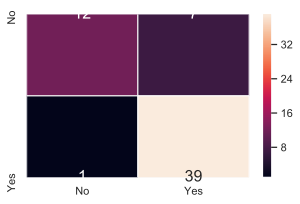

In [147]:
#Confusion matrix
cm=metrics.confusion_matrix(y_test, y_pred_status)
print("Confusion Matrix:\n ", cm)
df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (5,3))
sns.heatmap(df_cm, annot=True,fmt='g',linewidths=1,annot_kws={"size": 16})

In [148]:
dt_accuracy, dt_recall, dt_precision, dt_specificity, dt_f1_score = fit_n_print(dt_model, X_train, X_test, y_train, y_test)
result4 = pd.DataFrame({'Model' : ['DecisionTree'],
                          'Accuracy': [dt_accuracy],
                          'Recall' : [dt_recall],
                          'Precision': [dt_precision],
                          'Specificity': [dt_specificity],
                          'F1 Score' : [dt_f1_score]})
result4

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,DecisionTree,0.864,0.975,0.848,0.632,0.907


**Visualization of the Decission Tree Model**

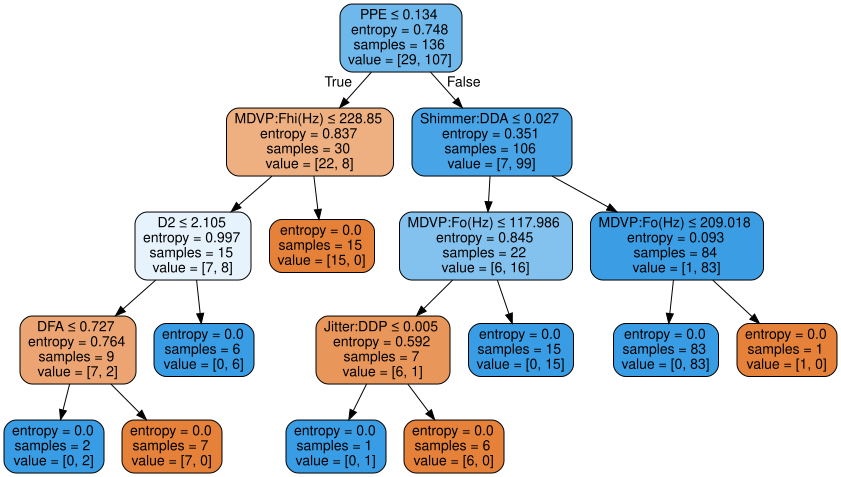

In [149]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(dt_model, out_file=None,feature_names=list(X_train),filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
graph

**Observation** With Leaf=5 all the entropy is comming 0, and does not require further iteration, if we would select 3, there we had entroy which is not zero and we would have end up not completing the Tree, Also the **accuracy of the model is :  86.44%**.

# Train at least one standard Ensemble model - Random forest, Bagging, Boosting etc, and note the accuracy (10 points)

**Ensemble RandomForest Classifier**

In [150]:
from sklearn.ensemble import RandomForestClassifier
#Find optimum number of tree using formula
# ntree = sqrt(number of rows * number of columns) / number of cpus
from math import sqrt
ntree = sqrt(195*23)/4
ntree
rf_model = RandomForestClassifier(n_estimators = int(ntree), random_state=1,max_features=12)
rf_model = rf_model.fit(X_train, y_train)
y_predict = rf_model.predict(X_test)

In [151]:
print("RandomForest Test Score: ", rf_model.score(X_test , y_test))
print("RandomForest Train Score: ", rf_model.score(X_train , y_train))

RandomForest Test Score:  0.8983050847457628
RandomForest Train Score:  1.0


Confusion Matrix:
  [[14  5]
 [ 1 39]]
Accuracy:  89.83050847457628 %


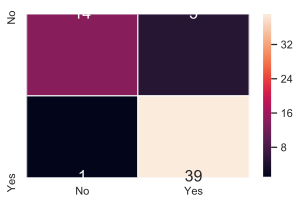

In [153]:
cm=metrics.confusion_matrix(y_test, y_predict,labels=[0, 1])
print("Confusion Matrix:\n ", cm)
#Accuracy
print("Accuracy: ", metrics.accuracy_score(y_test, y_predict) * 100, "%")
df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (5,3))
sns.heatmap(df_cm, annot=True,fmt='g',linewidths=1,annot_kws={"size": 16})

In [155]:
rf_accuracy, rf_recall, rf_precision, rf_specificity, rf_f1_score = fit_n_print(rf_model, X_train, X_test, y_train, y_test)
result5 = pd.DataFrame({'Model' : ['RandomForest'],
                          'Accuracy': [rf_accuracy],
                          'Recall' : [rf_recall],
                          'Precision': [rf_precision],
                          'Specificity': [rf_specificity],
                          'F1 Score' : [rf_f1_score]})
result5

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,RandomForest,0.898,0.975,0.886,0.737,0.928


**Ensemble Learning - Bagging**

In [156]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dt_model, n_estimators=50,random_state=1)

bgcl = bgcl.fit(X_train, y_train)
y_predict = bgcl.predict(X_test)

In [157]:
print("Bagging Test Score: ", bgcl.score(X_test , y_test))
print("Bagging Train Score: ", bgcl.score(X_train , y_train))

Bagging Test Score:  0.864406779661017
Bagging Train Score:  1.0


Confusion Matrix:
  [[12  7]
 [ 1 39]]
Accuracy:  86.4406779661017 %


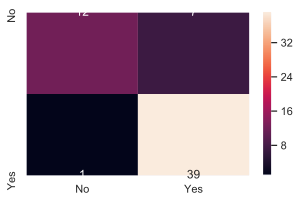

In [158]:
cm=metrics.confusion_matrix(y_test, y_predict,labels=[0, 1])
print("Confusion Matrix:\n ", cm)
#Accuracy
print("Accuracy: ", metrics.accuracy_score(y_test, y_predict) * 100, "%")

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (5,3))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [159]:
bg_accuracy, bg_recall, bg_precision, bg_specificity, bg_f1_score = fit_n_print(bgcl, X_train, X_test, y_train, y_test)
result6 = pd.DataFrame({'Model' : ['Bagging'],
                          'Accuracy': [bg_accuracy],
                          'Recall' : [bg_recall],
                          'Precision': [bg_precision],
                          'Specificity': [bg_specificity],
                          'F1 Score' : [bg_f1_score]})
result6

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,Bagging,0.864,0.975,0.848,0.632,0.907


**Ensemble Learning - AdaBoosting**

In [160]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=50, random_state=1)
abcl = abcl.fit(X_train, y_train)
y_predict = abcl.predict(X_test)

In [161]:
print("AdaBoost Test Score: ", abcl.score(X_test , y_test))
print("AdaBoost Train Score: ", abcl.score(X_train , y_train))

AdaBoost Test Score:  0.8983050847457628
AdaBoost Train Score:  1.0


Confusion Matrix:
  [[15  4]
 [ 2 38]]
Accuracy:  89.83050847457628 %


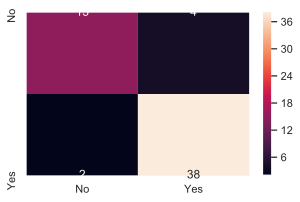

In [162]:
cm=metrics.confusion_matrix(y_test, y_predict,labels=[0, 1])
print("Confusion Matrix:\n ", cm)
#Accuracy
print("Accuracy: ", metrics.accuracy_score(y_test, y_predict) * 100, "%")

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (5,3))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [163]:
ab_accuracy, ab_recall, ab_precision, ab_specificity, ab_f1_score = fit_n_print(abcl, X_train, X_test, y_train, y_test)
result7 = pd.DataFrame({'Model' : ['AdaBoost'],
                          'Accuracy': [ab_accuracy],
                          'Recall' : [ab_recall],
                          'Precision': [ab_precision],
                          'Specificity': [ab_specificity],
                          'F1 Score' : [ab_f1_score]})
result7

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,AdaBoost,0.898,0.95,0.905,0.789,0.927


**Ensemble Learning - GradientBoost**

In [164]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50,random_state=1)
gbcl = gbcl.fit(X_train, y_train)
y_predict = gbcl.predict(X_test)

In [165]:
print("GradientBoosting Test Score: ", gbcl.score(X_test , y_test))
print("GradientBoosting Train Score: ", gbcl.score(X_train , y_train))

GradientBoosting Test Score:  0.8813559322033898
GradientBoosting Train Score:  1.0


Confusion Matrix:
  [[14  5]
 [ 2 38]]
Accuracy:  88.13559322033898 %


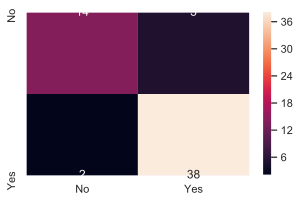

In [166]:
cm=metrics.confusion_matrix(y_test, y_predict,labels=[0, 1])
print("Confusion Matrix:\n ", cm)
#Accuracy
print("Accuracy: ", metrics.accuracy_score(y_test, y_predict) * 100, "%")

df_cm = pd.DataFrame(cm, index = [i for i in ["No","Yes"]],
                  columns = [i for i in ["No","Yes"]])
plt.figure(figsize = (5,3))
sns.heatmap(df_cm, annot=True ,fmt='g')

In [167]:
gb_accuracy, gb_recall, gb_precision, gb_specificity, gb_f1_score = fit_n_print(gbcl, X_train, X_test, y_train, y_test)
result8 = pd.DataFrame({'Model' : ['GradientBoosting'],
                          'Accuracy': [gb_accuracy],
                          'Recall' : [gb_recall],
                          'Precision': [gb_precision],
                          'Specificity': [gb_specificity],
                          'F1 Score' : [gb_f1_score]})
result8

,Model,Accuracy,Recall,Precision,Specificity,F1 Score
0,GradientBoosting,0.881,0.95,0.884,0.737,0.916


# Compare all the models (minimum 5) and pick the best one among them (10 points)

So Far we have worked with the following modeling-
    1. Logistic Regression
    2. Naive Bayes’
    3. SVM
    4. k-NN
    5. Decision Tree
    6. Random forest
    7. Bagging
    8. AdaBoosting
    9. GradientBoost

In [171]:
#Here are the result summary of all the model
#Before Unsampling of the Data
print(result1)
#with upsampling of the data
print(result2)
#With Down Sampling of the data
print(result3)

                 Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  Logistic Regression     0.814    0.95      0.809        0.526     0.874
1                  KNN     0.797    0.95      0.792        0.474     0.864
2         Naive Bayes'     0.712    0.60      0.960        0.947     0.738
3                  SVM     0.763    0.85      0.810        0.579     0.830
                 Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  Logistic Regression     0.780    0.80      0.865        0.737     0.831
1                  KNN     0.864    0.90      0.900        0.789     0.900
2         Naive Bayes'     0.746    0.65      0.963        0.947     0.776
3                  SVM     0.780    1.00      0.755        0.316     0.860
                 Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  Logistic Regression     0.655   0.750      0.667        0.538     0.706
1                  KNN     0.621   0.500      0.727        0.769     0.593
2         Naive Bayes'   

Post 3 iterations, KNN seems to be the model for this dataset, after Upsmapling (result2)>> KNN 0.864 0.90 0.900 0.789 0.900), So we will use **result 2 to compare with the other model**

In [176]:
#with upsampling of the data
print(result2,'\n')

#meta-classifier- Build Decision Tree Model - Accuracy: 86.4406779661017
print(result4,'\n')

#Random forest, Accuracy:  89.83050847457628 %
print(result5,'\n')
#Bagging, Accuracy:  86.4406779661017 %
print(result6,'\n')
#Boosting AdaBoosting Accuracy:  89.83050847457628 %
print(result7,'\n')

#Boosting GradientBoost Accuracy:  88.13559322033898 %
print(result8,'\n')

                 Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  Logistic Regression     0.780    0.80      0.865        0.737     0.831
1                  KNN     0.864    0.90      0.900        0.789     0.900
2         Naive Bayes'     0.746    0.65      0.963        0.947     0.776
3                  SVM     0.780    1.00      0.755        0.316     0.860 

          Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  DecisionTree     0.864   0.975      0.848        0.632     0.907 

          Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  RandomForest     0.898   0.975      0.886        0.737     0.928 

     Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  Bagging     0.864   0.975      0.848        0.632     0.907 

      Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  AdaBoost     0.898    0.95      0.905        0.789     0.927 

              Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  GradientBoosti

**Final Conclusion- Random forest is the best model accross all the tested model**

In [177]:
print(result5,'\n')

          Model  Accuracy  Recall  Precision  Specificity  F1 Score
0  RandomForest     0.898   0.975      0.886        0.737     0.928 



# ********************************END***************************************